In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             confusion_matrix, roc_curve, auc, precision_recall_curve, classification_report)
from sklearn.preprocessing import StandardScaler


In [2]:
df = pd.read_csv('College.csv')
print("The shape of the data is :",df.shape)

The shape of the data is : (777, 19)


In [3]:
df.columns

Index(['Unnamed: 0', 'Private', 'Apps', 'Accept', 'Enroll', 'Top10perc',
       'Top25perc', 'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board',
       'Books', 'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni',
       'Expend', 'Grad.Rate'],
      dtype='object')

In [4]:
df = df.rename(columns={'Unnamed: 0': 'University Name'})
df = df.set_index('University Name')
df.head(5)

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,
Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [5]:
df.columns

Index(['Private', 'Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc',
       'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books',
       'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend',
       'Grad.Rate'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 777 entries, Abilene Christian University to York College of Pennsylvania
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Private      777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: 

## The Data

We will use a DataFrame with 777 observations on the following 18 variables:

- **Private**: A factor with levels `No` and `Yes` indicating whether the university is private or public.
- **Apps**: The number of applications received.
- **Accept**: The number of applications accepted.
- **Enroll**: The number of new students enrolled.
- **Top10perc**: The percentage of new students from the top 10% of their high school class.
- **Top25perc**: The percentage of new students from the top 25% of their high school class.
- **F.Undergrad**: The number of full-time undergraduates.
- **P.Undergrad**: The number of part-time undergraduates.
- **Outstate**: The out-of-state tuition.
- **Room.Board**: The cost of room and board.
- **Books**: The estimated cost of books.
- **Personal**: The estimated personal spending.
- **PhD**: The percentage of faculty with Ph.D.’s.
- **Terminal**: The percentage of faculty with terminal degrees.
- **S.F.Ratio**: The student-to-faculty ratio.
- **perc.alumni**: The percentage of alumni who donate.
- **Expend**: Instructional expenditure per student.
- **Grad.Rate**: The graduation rate.


## Handling Missing Data and Separating Features and Target

Before we proceed with our analysis, it is important to handle any missing data that might exist. Missing data can distort our results, so we either remove or impute them.


In [7]:
missing_data = df.isnull().sum()
print("Missing values in each column:\n", missing_data)

Missing values in each column:
 Private        0
Apps           0
Accept         0
Enroll         0
Top10perc      0
Top25perc      0
F.Undergrad    0
P.Undergrad    0
Outstate       0
Room.Board     0
Books          0
Personal       0
PhD            0
Terminal       0
S.F.Ratio      0
perc.alumni    0
Expend         0
Grad.Rate      0
dtype: int64


No missing data is found so we do not need any replacement and can proceed

#Sanity check
Before we go furthur we should check if all of our data is sensible or not,\
for example \
(i)Percentage greater than 100 is absurd, \
(ii)Count which are negative\
and many more.

In our data set we have the following column whose data is in pecentage\
(i)Top10perc \
(ii)Top25perc \
(iii)PhD\
(iv)Terminal\
(v)perc.alumni\
(vi)Grad.Rate
      

In [8]:
df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


In [9]:
df[df['Top10perc'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,


In [10]:
df[df['Top25perc'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,


In [11]:
df[df['PhD'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,
Texas A&M University at Galveston,No,529,481,243,22,47,1206,134,4860,3122,600,650,103,88,17.4,16,6415,43


In [12]:
df['PhD']['Texas A&M University at Galveston'] = 100

/tmp/ipykernel_10365/2257017086.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PhD']['Texas A&M University at Galveston'] = 100


In [13]:
df[df['PhD'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,


In [14]:
df[df['Terminal'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,


In [15]:
df[df['perc.alumni'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,


In [16]:
df[df['Grad.Rate'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,
Cazenovia College,Yes,3847,3433,527,9,35,1010,12,9384,4840,600,500,22,47,14.3,20,7697,118


In [17]:
df['Grad.Rate']['Cazenovia College'] = 100

/tmp/ipykernel_10365/2087630962.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Grad.Rate']['Cazenovia College'] = 100


In [18]:
df[df['Grad.Rate'] > 100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,


## Exploratory Data Analysis (EDA)

### Summary Statistics
We start with summary statistics to get an overview of the dataset. These include the mean, standard deviation, minimum, 25 percentile,50 percentile, 75 percentile and maximum values for each feature. This helps us understand the range and distribution of the numerical data.

In [19]:
df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.656371,79.702703,14.089704,22.743887,9660.171171,65.440154
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.321324,14.722359,3.958349,12.391801,5221.768440,17.118804
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.000000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.000000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.000000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.000000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,100.000000,100.000000,39.800000,64.000000,56233.000000,100.000000


###  Separating Features and Target
We will separate the "Private" column (target) from the rest of the features.

In [20]:
x = df.drop('Private', axis=1)
y = df['Private']

print("Features shape:", x.shape)
print("Target shape:", y.shape)

Features shape: (777, 17)
Target shape: (777,)


In [21]:
x.columns

Index(['Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc', 'F.Undergrad',
       'P.Undergrad', 'Outstate', 'Room.Board', 'Books', 'Personal', 'PhD',
       'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend', 'Grad.Rate'],
      dtype='object')

In [22]:
index_name = x.index.name
print("Index name:", index_name)


Index name: University Name


In [23]:
x.head(3)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,
Abilene Christian University,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
Adelphi University,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
Adrian College,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54


###Check Class Distribution:

we will check how many universities are private and how many are public

/tmp/ipykernel_10365/3363504137.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y, palette='coolwarm')


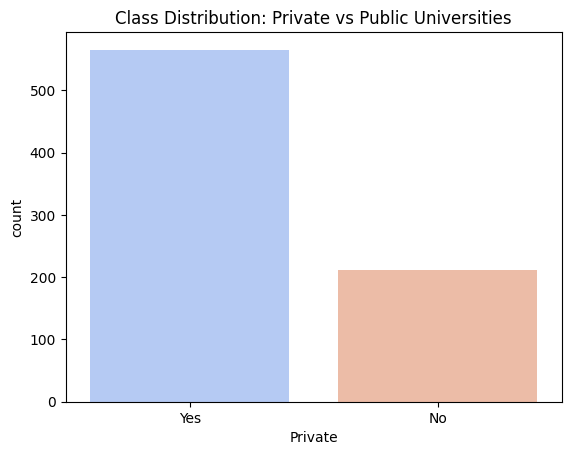

Class distribution:
 Private
Yes    565
No     212
Name: count, dtype: int64


In [24]:
sns.countplot(x=y, palette='coolwarm')
plt.title('Class Distribution: Private vs Public Universities')
plt.show()

print("Class distribution:\n", y.value_counts())

## Correlation Matrix

A correlation matrix is a table that shows the correlation coefficients between variables. Each cell in the matrix represents the correlation between two variables. Correlation coefficients range from -1 to 1, where:

- **1** indicates a perfect positive correlation, meaning that as one variable increases, the other variable also increases.
- **-1** indicates a perfect negative correlation, meaning that as one variable increases, the other variable decreases.
- **0** indicates no correlation between the variables.

The correlation matrix is useful for understanding the relationships between different variables in a dataset. It helps to identify which variables are strongly correlated and which are not, which can be valuable for feature selection and understanding the underlying structure of the data.

Below is the correlation matrix for our dataset, which includes all the variables with numerical columns.


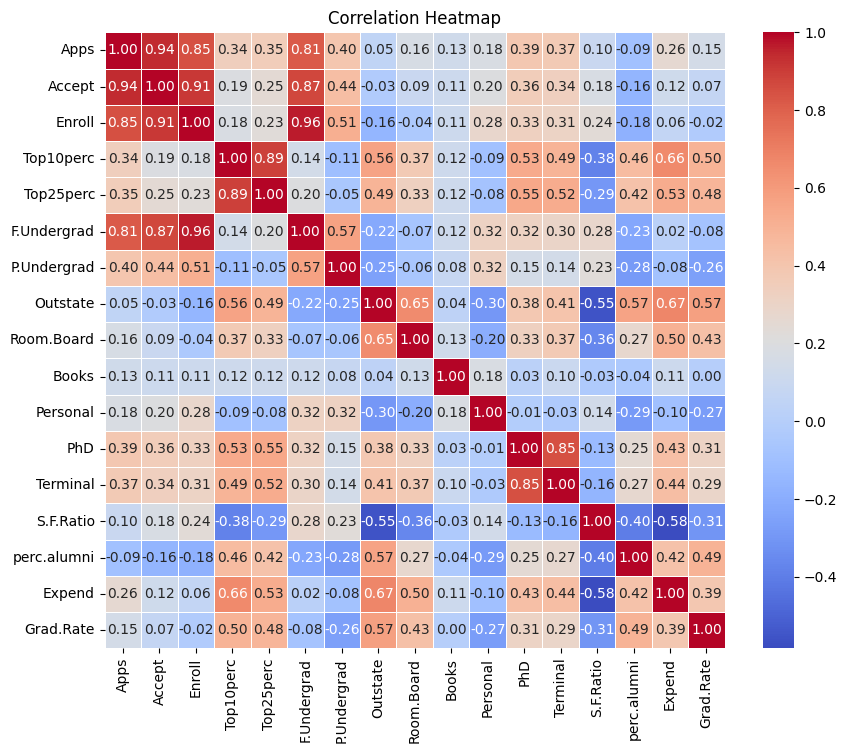

In [25]:
corr_matrix = df.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

Though we see that there is high correlation between \
(i)Apps & (Accept, Enroll & F.Undergrad) \
(ii)Accept & (Enroll & F.Undergrad) \
(iii)Enroll & F.Undergrad \
(iii)Top10perc & Top25perc \
(iv)PhD & Terminal \
\
We are not dropping it just for the sake of convinience to user input where we expect user to input all the 17 features.


Data Visualization: Exploring the Separation Between Private and Public Universities

Now, we will use some data visualization techniques to explore whether the features in the dataset can visually help in segregating private and public universities.

By plotting a scatter plot between different variables, we aim to observe any natural separation between the two types of universities.

In the scatter plot, the universities will be color-coded based on their type (Private or Public). This will help us to visually assess if there are any patterns or clusters that differentiate the two classes without applying any machine learning algorithm yet.

Let’s start by plotting the scatter plot and exploring the potential for visual segregation!

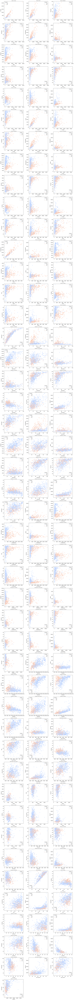

In [26]:
columns = [col for col in df.columns if col != 'Private']


fig, axes = plt.subplots(nrows=46, ncols=3, figsize=(15, 200))
plt.subplots_adjust(hspace=0.5, wspace=0.4)


axes = axes.flatten()


plot_index = 0


for i in range(len(columns)):
    for j in range(i + 1, len(columns)):
        if plot_index < len(axes):
            x_col = columns[i]
            y_col = columns[j]


            sns.scatterplot(x=x_col, y=y_col, data=df, hue='Private', palette='coolwarm', ax=axes[plot_index])
            axes[plot_index].set_title(f'{x_col} vs {y_col}', fontsize=8)

            plot_index += 1


for ax in axes[plot_index:]:
    fig.delaxes(ax)


plt.tight_layout()
plt.show()


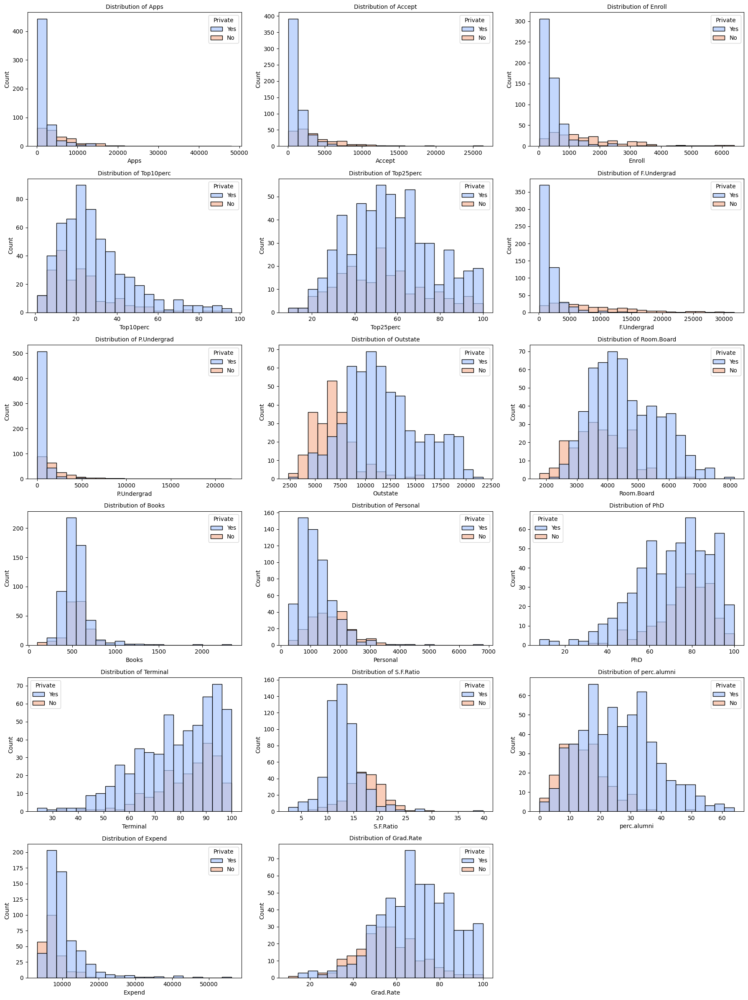

In [27]:
columns = [col for col in df.columns if col != 'Private']

fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(18, 24))
plt.subplots_adjust(hspace=0.5, wspace=0.4)

axes = axes.flatten()

for i, col in enumerate(columns):
  g = sns.histplot(df, x=col, hue="Private", palette='coolwarm', bins=20, ax=axes[i], alpha=0.7)

  axes[i].set_title(f'Distribution of {col}', fontsize=10)

for j in range(i + 1, len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


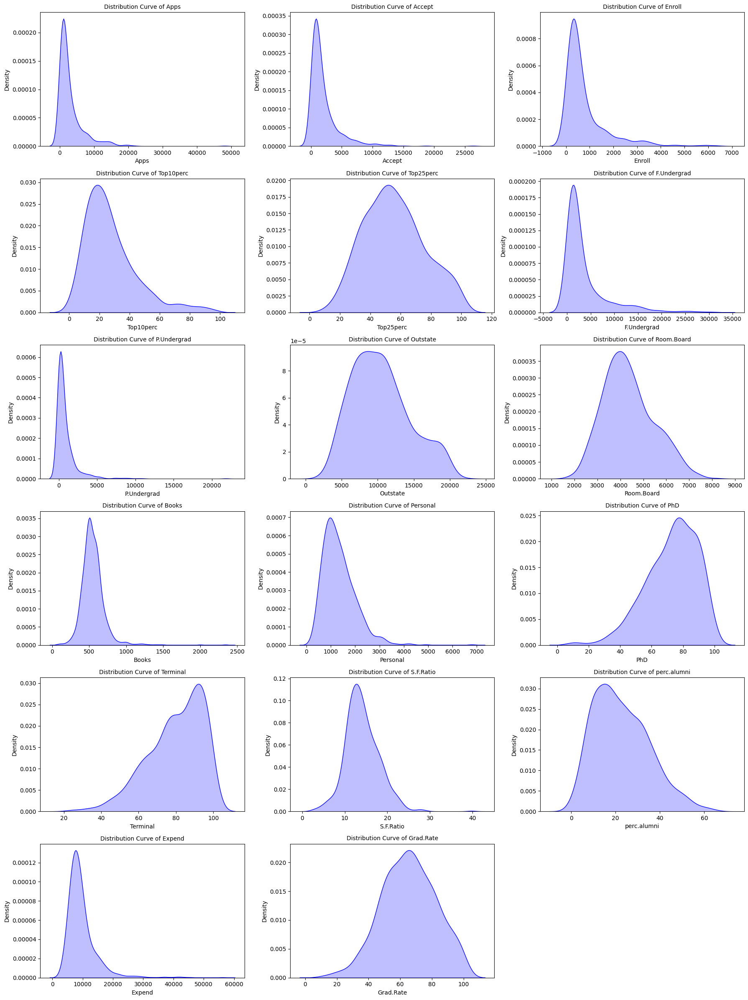

In [28]:
columns = [col for col in df.columns if col != 'Private']

fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(18, 24))
plt.subplots_adjust(hspace=0.5, wspace=0.4)

axes = axes.flatten()

for i, col in enumerate(columns):
     sns.kdeplot(df[col], ax=axes[i], color='blue', fill=True)

     axes[i].set_title(f'Distribution Curve of {col}', fontsize=10)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


###Linear Discriminant Analysis(LDA)

### Understanding Linear Discriminant Analysis (LDA)

Linear Discriminant Analysis (LDA) is a technique used for both dimensionality reduction and classification. It is particularly effective when the classes are well-separated and the data follows a Gaussian distribution within each class. LDA aims to project data onto a lower-dimensional space where the classes are as distinct as possible.

#### Objectives of LDA
1. **Maximize Between-Class Separation**: LDA seeks to find linear combinations of features that maximize the distance between the class means (i.e., the separation between classes).
2. **Minimize Within-Class Variance**: It also aims to minimize the spread of data points within each class, ensuring that data points in the same class are close to each other.

#### Assumptions of LDA
1. **Linearity**: The relationship between the features and the class labels is assumed to be linear.
2. **Normal Distribution**: The data within each class is assumed to follow a normal (Gaussian) distribution.
3. **Equal Covariance**: The covariance matrices of the classes are assumed to be the same, meaning the spread of data points is similar across classes.
4. **Class Independence**: The classes are assumed to be mutually exclusive.

---

### Steps in LDA

1. **Compute Mean Vectors for Each Class**:
   - Calculate the average feature values for each class. This gives the mean vector for each class.

2. **Compute Scatter Matrices**:
   - **Within-Class Scatter Matrix**: Measures how data points scatter within each class.
   - **Between-Class Scatter Matrix**: Measures how the class means scatter relative to the overall mean.

3. **Solve the Eigenvalue Problem**:
   - LDA solves a mathematical problem to find the best directions (linear combinations of features) that maximize the ratio of between-class variance to within-class variance.

4. **Select the Top Eigenvectors**:
   - Choose the eigenvectors corresponding to the largest eigenvalues. These eigenvectors form the new axes (directions) onto which the data will be projected.

5. **Project Data onto Lower Dimensions**:
   - Transform the data into the new lower-dimensional space defined by the selected eigenvectors. This reduces the number of dimensions while aiming to maintain class separability.

6. **Classify New Observations**:
   - For classification, assign a new data point to the class that is closest to it in the transformed space. The distances are calculated based on the new lower-dimensional representation.

---

### Key Concepts

1. **Projection**:
   LDA projects data onto new axes that maximize class separation. For two classes, this projection is onto a single line. For more classes, the projection space can have more dimensions.

2. **Maximizing Separation**:
   The main goal of LDA is to find directions that best separate the classes, making them more distinct in the new space.

3. **Comparison with PCA**:
   While Principal Component Analysis (PCA) reduces dimensionality by focusing on the directions of maximum variance without considering class labels, LDA specifically finds directions that enhance class separation.

4. **Gaussian Assumptions**:
   LDA assumes the data within each class follows a Gaussian distribution. This assumption is crucial for the effectiveness of LDA.

---

### Example of LDA in Practice

1. **Data Collection**: Assume we have a dataset with observations belonging to two classes (e.g., "Private" and "Public" universities).
2. **Feature Selection**: Choose numerical features such as `Outstate`, `Room.Board`, and `Grad.Rate`.
3. **Compute Scatter Matrices**: Calculate within-class and between-class scatter matrices to understand class separability.
4. **Project Data**: Use LDA to project the data onto a new axis that best separates the classes.
5. **Classification**: Classify new data points based on their position along this axis.

---

### Conclusion
Linear Discriminant Analysis is a powerful method for dimensionality reduction and classification, particularly when the assumptions about data distribution are met. By focusing on maximizing class separation, LDA transforms the data into a lower-dimensional space where the classes are more distinct, improving classification performance.


### Data Preparation for Linear Discriminant Analysis (LDA)

Before applying LDA, we need to ensure our dataset is properly prepared. Below are the key steps taken to preprocess the data:

1. **Standardization of Numerical Features**:
   - LDA is sensitive to the scale of the data, so it is important to standardize the numerical features. Standardization ensures that all features have the same scale, typically with a mean of 0 and a standard deviation of 1.
   - For this, we applied standardization to all columns except the target variable (`Private`).

2. **Outlier Removal**:
   - Outliers can have a significant impact on LDA performance. After standardizing the data, we will identify and remove any outliers that might distort the LDA projection and classification.

3. **Splitting the Data into Target and Feature Variables**:
   - Once the data is cleaned and standardized, we will split it into the feature variables (input data) and the target variable (`Private`), which represents whether a university is private or public.
   - The feature variables will be used to identify patterns, while the target variable will be used for classification in the LDA model.

With these preprocessing steps complete, we will proceed with performing LDA for dimensionality reduction and classification.


In [29]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

scaler = StandardScaler()
df_std = df.copy()
df_std[numerical_cols] = scaler.fit_transform(df[numerical_cols])

print("Original DataFrame shape:", df.shape)
print("Standardized DataFrame shape:", df_std.shape)

Original DataFrame shape: (777, 18)
Standardized DataFrame shape: (777, 18)


In [30]:
mean_vector = scaler.mean_
std_vector = scaler.scale_

print("Mean vector:", mean_vector)
print("Standard deviation vector:", std_vector)

Mean vector: [ 3001.63835264  2018.8043758    779.97297297    27.55855856
    55.7966538   3699.90733591   855.2985843  10440.66924067
  4357.52638353   549.38095238  1340.64221364    72.65637066
    79.7027027     14.08970399    22.74388674  9660.17117117
    65.44015444]
Standard deviation vector: [3.86771021e+03 2.44953617e+03 9.28578072e+02 1.76290091e+01
 1.97920291e+01 4.84729828e+03 1.52145189e+03 4.02042684e+03
 1.09599046e+03 1.64999081e+02 6.76635617e+02 1.63108183e+01
 1.47128816e+01 3.95580111e+00 1.23838248e+01 5.21840715e+03
 1.71077841e+01]


In [31]:
df_std.head(3)

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,,
Abilene Christian University,Yes,-0.346882,-0.321205,-0.063509,-0.258583,-0.191827,-0.168116,-0.209207,-0.746356,-0.964905,-0.602312,1.270045,-0.162859,-0.115729,1.013776,-0.867574,-0.50191,-0.317993
Adelphi University,Yes,-0.210884,-0.038703,-0.288584,-0.655656,-1.353911,-0.209788,0.244307,0.457496,1.909208,1.215880,0.235515,-2.676529,-3.378176,-0.477704,-0.544572,0.16611,-0.551805
Adrian College,Yes,-0.406866,-0.376318,-0.478121,-0.315307,-0.292878,-0.549565,-0.497090,0.201305,-0.554317,-0.905344,-0.259582,-1.205112,-0.931341,-0.300749,0.585935,-0.17729,-0.668710


In [32]:
df_std.columns

Index(['Private', 'Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc',
       'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books',
       'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend',
       'Grad.Rate'],
      dtype='object')

In [33]:
df_std.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,777.000000,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02,7.770000e+02
mean,3.657878e-17,5.486816e-17,-5.486816e-17,-4.115112e-17,-1.554598e-16,1.828939e-17,0.000000,1.554598e-16,3.474984e-16,-1.760354e-16,4.572347e-17,1.097363e-16,-4.115112e-16,-6.401286e-17,9.144694e-18,1.325981e-16,-2.469067e-16
std,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00,1.000644e+00
min,-7.551337e-01,-7.947645e-01,-8.022728e-01,-1.506526e+00,-2.364419e+00,-7.346169e-01,-0.561502,-2.014878e+00,-2.351778e+00,-2.747779e+00,-1.611860e+00,-3.964018e+00,-3.785982e+00,-2.929799e+00,-1.836580e+00,-1.240641e+00,-3.240639e+00
25%,-5.754408e-01,-5.775805e-01,-5.793514e-01,-7.123803e-01,-7.476067e-01,-5.586426e-01,-0.499719,-7.762035e-01,-6.939170e-01,-4.810994e-01,-7.251203e-01,-6.533315e-01,-5.915023e-01,-6.546598e-01,-7.868237e-01,-5.574826e-01,-7.271634e-01
50%,-3.732540e-01,-3.710108e-01,-3.725836e-01,-2.585828e-01,-9.077663e-02,-4.111378e-01,-0.330144,-1.120949e-01,-1.437297e-01,-2.992802e-01,-2.078552e-01,1.436856e-01,1.561419e-01,-1.237939e-01,-1.408197e-01,-2.458933e-01,-2.572831e-02
75%,1.609122e-01,1.654173e-01,1.314128e-01,4.221134e-01,6.671042e-01,6.294077e-02,0.073418,6.179271e-01,6.318245e-01,3.067838e-01,5.310950e-01,7.567756e-01,8.358184e-01,6.093067e-01,6.666852e-01,2.241735e-01,7.341597e-01
max,1.165867e+01,9.924816e+00,6.043678e+00,3.882319e+00,2.233391e+00,5.764674e+00,13.789921,2.800531e+00,3.436593e+00,1.085230e+01,8.068387e+00,1.676411e+00,1.379560e+00,6.499390e+00,3.331452e+00,8.924721e+00,2.020124e+00


In [34]:
df_std.info()

<class 'pandas.core.frame.DataFrame'>
Index: 777 entries, Abilene Christian University to York College of Pennsylvania
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Private      777 non-null    object 
 1   Apps         777 non-null    float64
 2   Accept       777 non-null    float64
 3   Enroll       777 non-null    float64
 4   Top10perc    777 non-null    float64
 5   Top25perc    777 non-null    float64
 6   F.Undergrad  777 non-null    float64
 7   P.Undergrad  777 non-null    float64
 8   Outstate     777 non-null    float64
 9   Room.Board   777 non-null    float64
 10  Books        777 non-null    float64
 11  Personal     777 non-null    float64
 12  PhD          777 non-null    float64
 13  Terminal     777 non-null    float64
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    float64
 16  Expend       777 non-null    float64
 17  Grad.Rate    777 non-null    float64
dtypes: 

In [35]:
df_std_cleaned = df_std[(df_std[numerical_cols] >= -3).all(axis=1) & (df_std[numerical_cols] <= 3).all(axis=1)]

In [36]:
df_std_cleaned.shape

(682, 18)

In [37]:
x_final = df_std_cleaned.drop('Private', axis=1)
y_final = df_std_cleaned['Private']

print("Final Features shape:", x_final.shape)
print("Final Target shape:", y_final.shape)

Final Features shape: (682, 17)
Final Target shape: (682,)


In [38]:
x_final.columns

Index(['Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc', 'F.Undergrad',
       'P.Undergrad', 'Outstate', 'Room.Board', 'Books', 'Personal', 'PhD',
       'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend', 'Grad.Rate'],
      dtype='object')

In [39]:
index_name = x_final.index.name
print("Index name:", index_name)

Index name: University Name


In [40]:
x_final.head(3)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
University Name,,,,,,,,,,,,,,,,,
Abilene Christian University,-0.346882,-0.321205,-0.063509,-0.258583,-0.191827,-0.168116,-0.209207,-0.746356,-0.964905,-0.602312,1.270045,-0.162859,-0.115729,1.013776,-0.867574,-0.501910,-0.317993
Adrian College,-0.406866,-0.376318,-0.478121,-0.315307,-0.292878,-0.549565,-0.497090,0.201305,-0.554317,-0.905344,-0.259582,-1.205112,-0.931341,-0.300749,0.585935,-0.177290,-0.668710
Agnes Scott College,-0.668261,-0.681682,-0.692427,1.840231,1.677612,-0.658079,-0.520752,0.626633,0.996791,-0.602312,-0.688173,1.185939,1.175657,-1.615274,1.151188,1.792851,-0.376446


/tmp/ipykernel_10365/3803333301.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_final, palette='coolwarm')


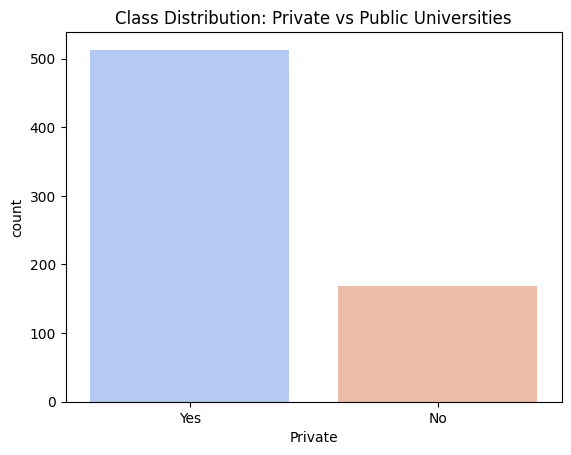

Class distribution:
 Private
Yes    513
No     169
Name: count, dtype: int64


In [61]:
sns.countplot(x=y_final, palette='coolwarm')
plt.title('Class Distribution: Private vs Public Universities')
plt.show()

print("Class distribution:\n", y_final.value_counts())

In [42]:
y_final_numeric = y_final.map({'Yes': 1, 'No': 0})

In [43]:
X_train, X_test, y_train, y_test = train_test_split(x_final, y_final_numeric, test_size=0.3, random_state=42)

print(f"Original dataset size: {x_final.shape[0]} samples")
print(f"Training set size: {X_train.shape[0]} samples")
print(f"Test set size: {X_test.shape[0]} samples")
print(f"Number of features in training set: {X_train.shape[1]}")
print(f"Number of features in test set: {X_test.shape[1]}")

Original dataset size: 682 samples
Training set size: 477 samples
Test set size: 205 samples
Number of features in training set: 17
Number of features in test set: 17


In [44]:
lda = LDA(n_components=1)
X_train_lda = lda.fit_transform(X_train, y_train)
X_test_lda = lda.transform(X_test)

print(f"Shape of LDA transformed training data: {X_train_lda.shape}")
print(f"Shape of LDA transformed test data: {X_test_lda.shape}")

Shape of LDA transformed training data: (477, 1)
Shape of LDA transformed test data: (205, 1)


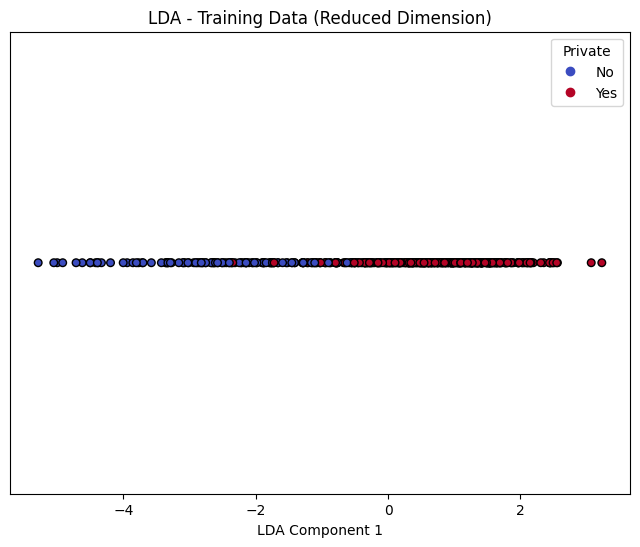

In [45]:
plt.figure(figsize=(8, 6))

scatter = plt.scatter(X_train_lda, [0]*len(X_train_lda), c=y_train, cmap='coolwarm',edgecolor='k', s=30)

plt.legend(handles=scatter.legend_elements()[0], labels=['No', 'Yes'], title='Private')

plt.title('LDA - Training Data (Reduced Dimension)')
plt.xlabel('LDA Component 1')
plt.yticks([])
plt.show()

In [46]:
eigenvector = lda.coef_.flatten()
print("Eigenvector for the first LDA axis:", eigenvector)

print("Shape of the eigenvector:", eigenvector.shape)

print("Reduced vector (training data):", X_train_lda.flatten())
print("Shape of the reduced vector:", X_train_lda.shape)

Eigenvector for the first LDA axis: [-3.43764517e+00  3.81802822e+00 -1.17374520e-01  6.37227094e-01
 -9.27899748e-02 -4.59227698e+00  2.42912836e-03  2.84582172e+00
  4.05481469e-01  4.63707245e-01  3.36940155e-01 -1.12426724e+00
 -5.34252089e-01 -1.37170778e+00  2.00483924e-01 -8.34550735e-01
  6.44814621e-01]
Shape of the eigenvector: (17,)
Reduced vector (training data): [ 1.26610038e+00 -2.05083255e+00  9.77786398e-01  2.11195175e+00
  1.61692705e-01  2.67255320e-01  7.07626987e-01  2.04957741e+00
 -4.38273551e+00  9.54239883e-01 -1.41136159e+00  4.80968061e-01
  5.62434973e-01  1.56688908e+00 -1.03232840e+00  5.70650540e-01
  4.70817528e-01  1.60636387e-01  3.32387164e-01  8.08080752e-01
  1.20087038e+00  8.26997129e-01  1.89356240e+00  6.40393889e-01
 -2.13987648e+00  6.03485938e-02 -2.63496210e+00  4.86862417e-01
  2.77508281e-02  3.60598672e-01  4.16472234e-01 -2.40258815e+00
 -3.35609011e+00  6.04439324e-01  8.19482475e-01  1.51844647e+00
 -2.22241115e+00  1.77848061e+00  6.5

In [47]:
y_pred = lda.predict(X_test)

Evaluation Metrics:
Accuracy: 0.94
Precision: 0.96
Recall: 0.97
F1 Score: 0.96

Classification Report:
              precision    recall  f1-score   support

          No       0.88      0.84      0.86        45
         Yes       0.96      0.97      0.96       160

    accuracy                           0.94       205
   macro avg       0.92      0.91      0.91       205
weighted avg       0.94      0.94      0.94       205



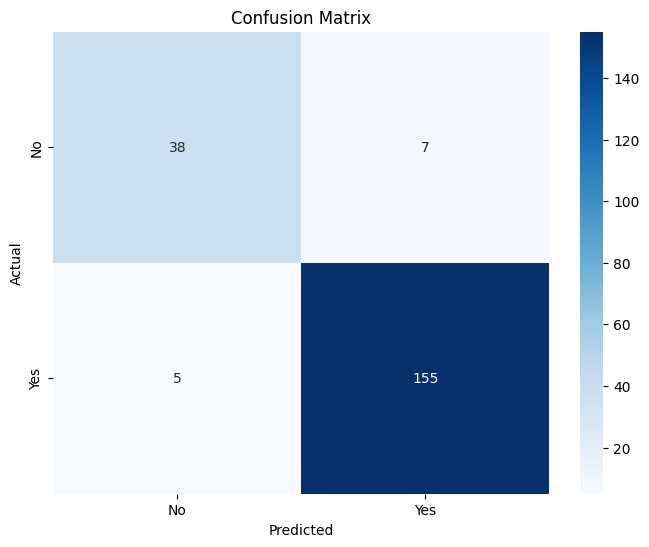

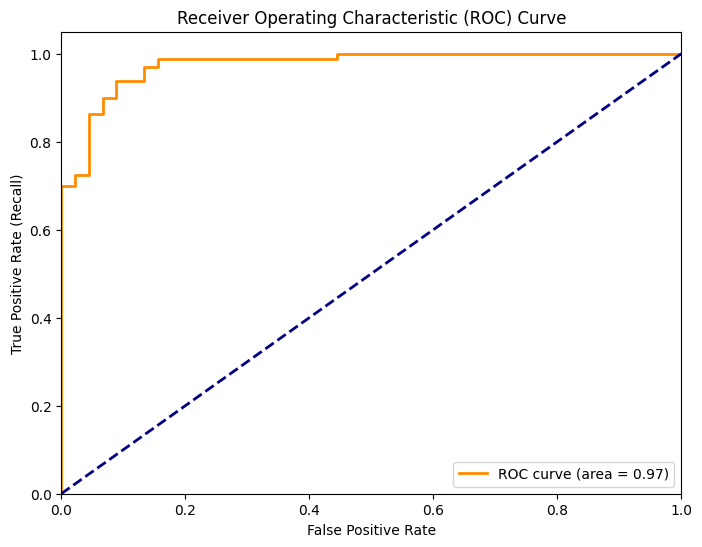

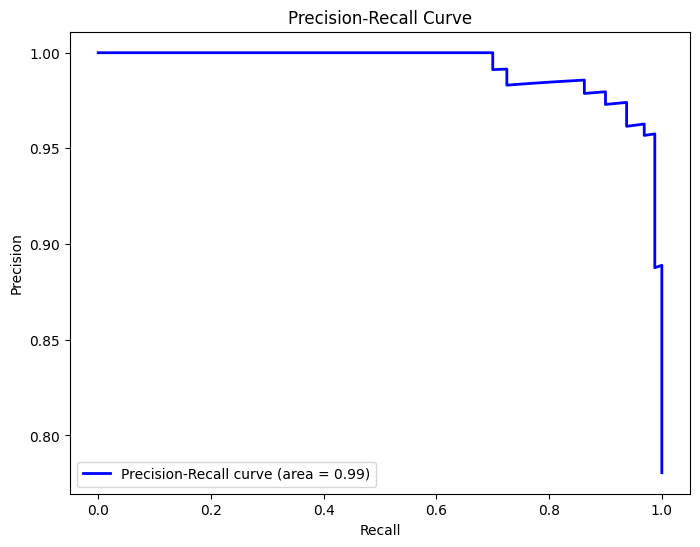

In [48]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred, target_names=['No', 'Yes'])

# Print evaluation metrics
print("Evaluation Metrics:")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Print classification report
print("\nClassification Report:")
print(class_report)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
conf_matrix_df = pd.DataFrame(conf_matrix, index=['No', 'Yes'], columns=['No', 'Yes'])
sns.heatmap(conf_matrix_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# ROC Curve
y_prob = lda.predict_proba(X_test)[:, 1]  # Obtain probabilities for the positive class
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob)
pr_auc = auc(recall, precision)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label=f'Precision-Recall curve (area = {pr_auc:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()


We want to check for which feature are contributing more to the projected score for any observation,then we are sorting them in descending order of threr contribution also ,we are not checking for the direction so we sort the vector used to reduce this on basis of its absolute value.

In [49]:
coefficients = lda.coef_.flatten()
feature_names = X_train.columns
coeff_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})
coeff_df.index = coeff_df.index + 1
print("Original Coefficients DataFrame:")
print(coeff_df)


coeff_df['Abs_Coefficient'] = coeff_df['Coefficient'].abs()
sorted_coeff_df = coeff_df.sort_values(by='Abs_Coefficient', ascending=False)

print("\nSorted Coefficients DataFrame:")
print(sorted_coeff_df)


Original Coefficients DataFrame:
        Feature  Coefficient
1          Apps    -3.437645
2        Accept     3.818028
3        Enroll    -0.117375
4     Top10perc     0.637227
5     Top25perc    -0.092790
6   F.Undergrad    -4.592277
7   P.Undergrad     0.002429
8      Outstate     2.845822
9    Room.Board     0.405481
10        Books     0.463707
11     Personal     0.336940
12          PhD    -1.124267
13     Terminal    -0.534252
14    S.F.Ratio    -1.371708
15  perc.alumni     0.200484
16       Expend    -0.834551
17    Grad.Rate     0.644815

Sorted Coefficients DataFrame:
        Feature  Coefficient  Abs_Coefficient
6   F.Undergrad    -4.592277         4.592277
2        Accept     3.818028         3.818028
1          Apps    -3.437645         3.437645
8      Outstate     2.845822         2.845822
14    S.F.Ratio    -1.371708         1.371708
12          PhD    -1.124267         1.124267
16       Expend    -0.834551         0.834551
17    Grad.Rate     0.644815         0.644815

In [50]:
lgc = LogisticRegression(random_state=42)
lgc.fit(X_train_lda, y_train)

LogisticRegression(random_state=42)

In [51]:
y_pred_lgc = lgc.predict(X_test_lda)

Evaluation Metrics:
Accuracy: 0.94
Precision: 0.96
Recall: 0.96
F1 Score: 0.96

Classification Report:
              precision    recall  f1-score   support

          No       0.87      0.87      0.87        45
         Yes       0.96      0.96      0.96       160

    accuracy                           0.94       205
   macro avg       0.91      0.91      0.91       205
weighted avg       0.94      0.94      0.94       205



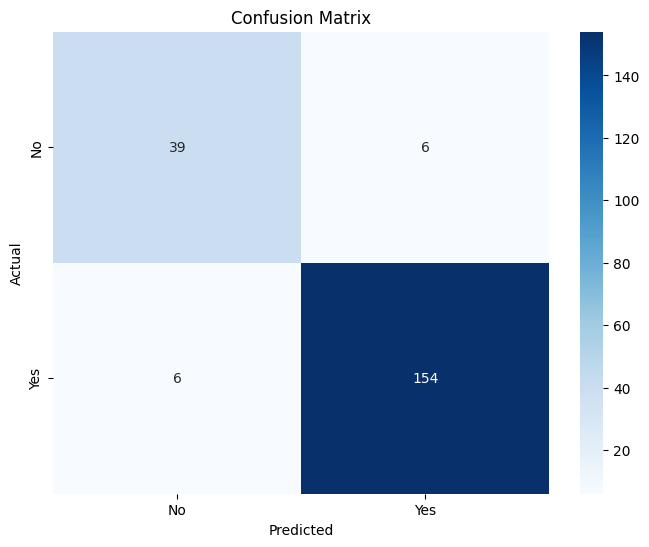

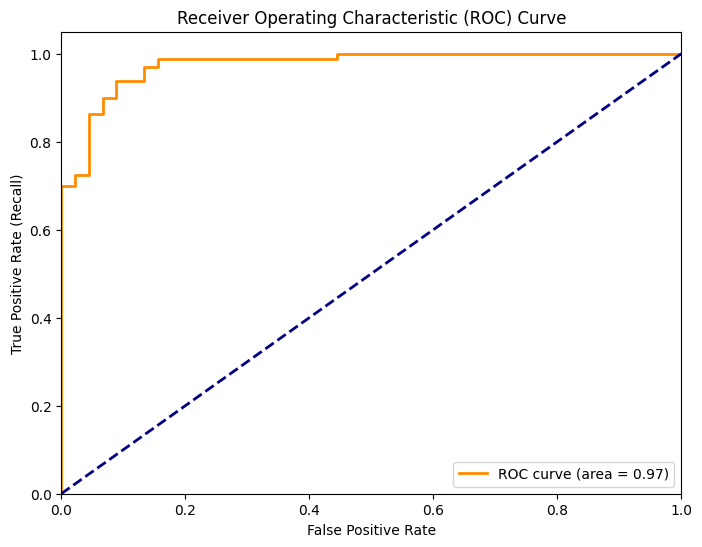

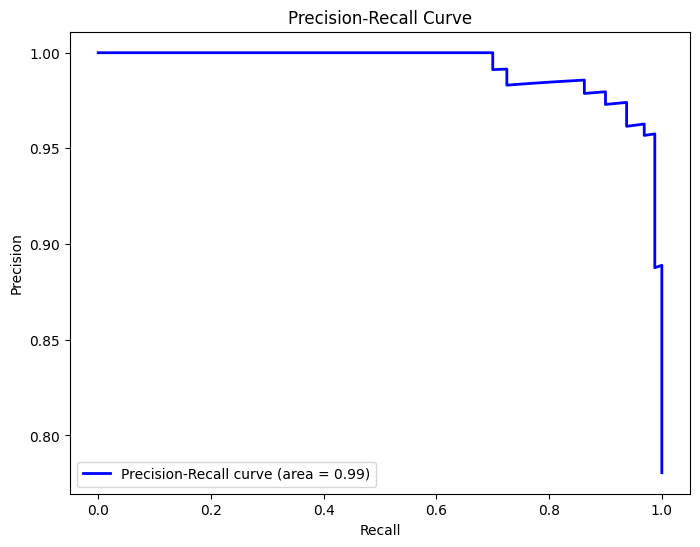

In [52]:
# Compute evaluation metrics using y_pred_lgc
accuracy = accuracy_score(y_test, y_pred_lgc)
precision = precision_score(y_test, y_pred_lgc)
recall = recall_score(y_test, y_pred_lgc)
f1 = f1_score(y_test, y_pred_lgc)
conf_matrix = confusion_matrix(y_test, y_pred_lgc)
class_report = classification_report(y_test, y_pred_lgc, target_names=['No', 'Yes'])

# Print evaluation metrics
print("Evaluation Metrics:")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Print classification report
print("\nClassification Report:")
print(class_report)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
conf_matrix_df = pd.DataFrame(conf_matrix, index=['No', 'Yes'], columns=['No', 'Yes'])
sns.heatmap(conf_matrix_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# ROC Curve
y_prob = lda.predict_proba(X_test)[:, 1]  # Obtain probabilities for the positive class
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob)
pr_auc = auc(recall, precision)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label=f'Precision-Recall curve (area = {pr_auc:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()


We are trying to get a projected value as user input and let our logistic regressor classifier predict the class for the observation whose projected value is given.

In [53]:
def get_projected_value():
    while True:
        try:
            projected_value = float(input("Enter the projected value: "))
            break
        except ValueError:
            print("Invalid input. Please enter a numerical value.")
    return projected_value

def predict_class_from_projected(lgc_model, projected_value):
    projected_value_array = np.array([[projected_value]])
    predicted_class_numeric = lgc_model.predict(projected_value_array)[0]
    class_labels = {0: 'No', 1: 'Yes'}
    return class_labels[predicted_class_numeric]

projected_value = get_projected_value()
predicted_class = predict_class_from_projected(lgc, projected_value)
print(f"Predicted Class for the projected value {projected_value}: {predicted_class}")

Enter the projected value: -2.14658
Predicted Class for the projected value -2.14658: No


We are trying to get the feature vector as a user input,then we are standardizing it using the scaler which stores a mean and standard deviation vector,then we are using our model lda to reduce the 17 features to 1.After getting the reduced value we use logistic regressor classifier to predict the class for the observation whose feature vector is given.

In [54]:
def get_user_input_features():
    feature_names = ['Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc', 'F.Undergrad',
                     'P.Undergrad', 'Outstate', 'Room.Board', 'Books', 'Personal', 'PhD',
                     'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend', 'Grad.Rate']

    input_values = []
    print("Please enter the following features:")

    for feature in feature_names:
        while True:
            try:
                value = float(input(f"{feature}: "))
                input_values.append(value)
                break
            except ValueError:
                print("Invalid input. Please enter a numerical value.")

    return np.array(input_values).reshape(1, -1)
def predict_class_with_reduced_features(scaler, lda_model, lgc_model):
    input_values = get_user_input_features()
    standardized_values = scaler.transform(input_values)
    reduced_value = lda_model.transform(standardized_values)
    predicted_class_numeric = lgc_model.predict(reduced_value)[0]

    class_labels = {0: 'No', 1: 'Yes'}
    predicted_class = class_labels[predicted_class_numeric]

    lda_coefficients = lda_model.coef_.flatten()  # Get the LDA coefficients

    return input_values.flatten(), standardized_values.flatten(), reduced_value[0, 0], predicted_class, lda_coefficients

input_vector, standardized_vector, projected_value, predicted_class, lda_coefficients = predict_class_with_reduced_features(scaler, lda, lgc)

print("\nInput Vector:")
print(input_vector)

print("\nStandardized Vector:")
print(standardized_vector)

print(f"\nProjected Value: {projected_value}")
print(f"Predicted Class: {predicted_class}")

print("\nLDA Coefficients:")
print(lda_coefficients)


Please enter the following features:
Apps: 1428
Accept: 1097
Enroll: 512
Top10perc: 16
Top25perc: 29
F.Undergrad: 1036
P.Undergrad: 911250
Outstate: 3750
Room.Board: 400
Books: 250
Personal: 12
PhD: 19
Terminal: 45
S.F.Ratio: 75
perc.alumni: 78
Expend: 15
Grad.Rate: 89

Input Vector:
[1.4280e+03 1.0970e+03 5.1200e+02 1.6000e+01 2.9000e+01 1.0360e+03
 9.1125e+05 3.7500e+03 4.0000e+02 2.5000e+02 1.2000e+01 1.9000e+01
 4.5000e+01 7.5000e+01 7.8000e+01 1.5000e+01 8.9000e+01]

Standardized Vector:
[-4.06865631e-01 -3.76317928e-01 -2.88584214e-01 -6.55655599e-01
 -1.35391140e+00 -5.49565383e-01  5.98372324e+02 -1.66416888e+00
 -3.61091316e+00 -1.81444013e+00 -1.96360076e+00 -3.28961856e+00
 -2.35866118e+00  1.53977145e+01  4.46195858e+00 -1.84829794e+00
  1.37714186e+00]

Projected Value: -5.54451853591073
Predicted Class: No

LDA Coefficients:
[-3.43764517e+00  3.81802822e+00 -1.17374520e-01  6.37227094e-01
 -9.27899748e-02 -4.59227698e+00  2.42912836e-03  2.84582172e+00
  4.05481469e-01  4

/home/iiserb/.local/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/home/iiserb/.local/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


using lda model

In [55]:
def get_user_input_features():
    feature_names = ['Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc', 'F.Undergrad',
                     'P.Undergrad', 'Outstate', 'Room.Board', 'Books', 'Personal', 'PhD',
                     'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend', 'Grad.Rate']

    input_values = []
    print("Please enter the following features:")

    for feature in feature_names:
        while True:
            try:
                value = float(input(f"{feature}: "))
                input_values.append(value)
                break
            except ValueError:
                print("Invalid input. Please enter a numerical value.")

    return np.array(input_values).reshape(1, -1)

def predict_class_with_lda(scaler, lda_model):
    input_values = get_user_input_features()
    standardized_values = scaler.transform(input_values)
    reduced_value = lda_model.transform(standardized_values)
    predicted_class_numeric = lda_model.predict(standardized_values)[0]

    class_labels = {0: 'No', 1: 'Yes'}
    predicted_class = class_labels[predicted_class_numeric]

    return reduced_value[0, 0], predicted_class

projected_value, predicted_class = predict_class_with_lda(scaler, lda)
print(f"Projected Value: {projected_value}")
print(f"Predicted Class: {predicted_class}")


Please enter the following features:
Apps: 193
Accept: 146
Enroll: 55
Top10perc: 16
Top25perc: 44
F.Undergrad: 249
P.Undergrad: 869
Outstate: 7560
Room.Board: 4120
Books: 800
Personal: 1500
PhD: 76
Terminal: 72
S.F.Ratio: 11.9
perc.alumni: 2
Expend: 10922
Grad.Rate: 15
Projected Value: -0.34814777966144056
Predicted Class: Yes


/home/iiserb/.local/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/home/iiserb/.local/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/home/iiserb/.local/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


Just getting a table with all the university of our original data and observing how our model performs

In [56]:
X = df_std.iloc[:, 1:]
y = df_std.iloc[:, 0]
indices = df_std.index

X_lda = lda.transform(X)
y_pred = lda.predict(X)

result_df_std_lda = pd.DataFrame({
    'Projected Value': X_lda.flatten().round(2),
    'Private': y,
    'Predicted Class': ['Yes' if pred == 1 else 'No' for pred in y_pred],
    # 'Correct': [1 if actual == 'Yes' and pred == 1 or actual == 'No' and pred == 0 else 0 for actual, pred in zip(y, y_pred)]
    'Correct': [1 if actual == 'Yes' and pred == 1 or actual == 'No' and pred == 0 else 0 for (actual, pred) in zip(y, y_pred)]
})

print(f"Shape of result DataFrame: {result_df_std_lda.shape}")
print(f"Percentage of correct predictions: {result_df_std_lda['Correct'].mean() * 100:.2f}%")

result_df_std_lda.head(800)


Shape of result DataFrame: (777, 4)
Percentage of correct predictions: 93.56%


,Projected Value,Private,Predicted Class,Correct
University Name,,,,
Abilene Christian University,-1.13,Yes,No,0
Adelphi University,2.58,Yes,Yes,1
Adrian College,1.14,Yes,Yes,1
Agnes Scott College,1.11,Yes,Yes,1
Alaska Pacific University,-0.35,Yes,Yes,1
...,...,...,...,...
Worcester State College,-1.55,No,No,1
Xavier University,0.95,Yes,Yes,1
Xavier University of Louisiana,-0.52,Yes,Yes,1
